# Review of baseline aggregate regression methods for vertical disaggregation problem

In [ ]:
%load_ext autoreload
%autoreload 2

In [3]:
import os
import sys
import tqdm
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from gpytorch import kernels

base_dir = os.path.join(os.getcwd(), '..')
sys.path.append(base_dir)

from src.models import AggregateKRR, ConditionalAggregateKRR, AggregateRidgeRegression
standardize = lambda x: (x - x.mean()) / x.std()
inv_softplus = lambda x, n: torch.log(torch.exp(x * torch.ones(n)) - 1)

# Dataset

We load dataset containing following variables:
- `cl` : cloud coverage
- `hur` : relative humidity
- `conccn` : CCN concentration

Variables are collocated over 96 latitude, 144 longitudes and 32 pressure levels.

A simulated aggregated target field is generated by integrating the cloud coverage field over pressure levels.

In [4]:
# Load dataset
dataset = xr.open_dataset('./cl_hur_conccn_lat96_lon144_plev32.nc')
target_field = dataset.cl.integrate('plev') / dataset.cl.plev.diff('plev').sum()

# Standardize
std_dataset = standardize(dataset)
std_target_field = standardize(target_field)

# Convert as Tensors

Convert the above into following tensors:

- `individuals_grid -` (96, 144, 32, 5) tensor where each lat/lon/pressure_level cell contains 5 covariates: relative humidity, CCN concentration, latitude, longitude, pressure level

- `bags_grid -` (96, 144, 3) tensor where each lat/lon cell contains 3 covariates: simulated aggregate cloud cover value, latitude and longitude

- `target_grid -` (96, 144) tensor where each lat/lon cell contains simulated aggregate cloud cover value

- `groundtruth_grid -` (96, 144, 32) 3D tensor of actual groundtruth cloud cover per lat, lon and pressure_level

In [5]:
def make_lat_lon_grid_tensor(field):
    """Makes 2D lat/lon tensor grid corresponding to 
    provided xarray dataarray
    """
    lat = torch.from_numpy(field.lat.values)
    lon = torch.from_numpy(field.lon.values)
    lat, lon = standardize(lat), standardize(lon)
    grid = torch.stack(torch.meshgrid(lat, lon), dim=-1).float()
    return grid

def make_lat_lon_plev_grid_tensor(field):
    """Makes 3D lat/lon/plev tensor grid corresponding to 
    provided xarray dataarray
    """
    plev = torch.from_numpy(field.plev.values)
    lat = torch.from_numpy(field.lat.values)
    lon = torch.from_numpy(field.lon.values)
    plev, lat, lon = standardize(plev), standardize(lat), standardize(lon)
    grid = torch.stack(torch.meshgrid(plev, lat, lon), dim=-1).float()
    return grid

In [6]:
# Construct grid of individuals covariates
lat_lon_plev_grid = make_lat_lon_plev_grid_tensor(dataset['cl'])
hur_conccn_grid = np.stack([std_dataset['hur'], std_dataset['conccn']], axis=-1)
individuals_grid = torch.cat([lat_lon_plev_grid, torch.from_numpy(hur_conccn_grid)], dim=-1).float()
individuals_grid = individuals_grid.permute(1, 2, 0, 3)
print("Individuals covariates grid : ", individuals_grid.shape)

# Construct grid of targets, bags and groundtruth covariates
lat_lon_grid = make_lat_lon_grid_tensor(dataset['cl'])
target_grid = torch.from_numpy(std_target_field.values).float()
bags_grid = torch.cat([lat_lon_grid, target_grid.unsqueeze(-1)], dim=-1).float()
groundtruth_grid = torch.from_numpy(std_dataset['cl'].values).permute(1, 2, 0).float()

print("Bags covariates grid : ", bags_grid.shape)
print("Aggregate targets grid : ", target_grid.shape)
print("Groundtruth target grid : ", groundtruth_grid.shape)

Individuals covariates grid :  torch.Size([96, 144, 32, 5])
Bags covariates grid :  torch.Size([96, 144, 3])
Aggregate targets grid :  torch.Size([96, 144])
Groundtruth target grid :  torch.Size([96, 144, 32])


In [7]:
# Flatten lat/lon for convenience
individuals_covariates = individuals_grid.view(-1, 32, 5)
bags_covariates = bags_grid.view(-1, 3)
target_covariates = target_grid.view(-1)
groundtruth_covariates = groundtruth_grid.view(-1, 32)

print("Individuals : ", individuals_covariates.shape)
print("Bags : ", bags_covariates.shape)
print("Targets : ", target_covariates.shape)
print("Groundtruth : ", groundtruth_covariates.shape)

Individuals :  torch.Size([13824, 32, 5])
Bags :  torch.Size([13824, 3])
Targets :  torch.Size([13824])
Groundtruth :  torch.Size([13824, 32])


# Utilities

Define evaluation anf visualization utility for models predictions

In [8]:
def plot_rmse_profile(pred, groundtruth):
    """Plots RMSE of prediction by pressure level
    """
    squared_error = torch.pow(pred - groundtruth.flatten(), 2)
    rmse_profile = squared_error.reshape(*groundtruth_grid.shape).mean(dim=(0, 1)).sqrt()
    global_rmse = round(squared_error.mean().sqrt().item(), 3)
    p_levels = rmse_profile.size(0)
    fig, ax = plt.subplots(1, 1, figsize=(5, 3))
    ax.plot(range(p_levels), rmse_profile, '--', label=f"RMSE={global_rmse}")
    ax.grid(alpha=0.5)
    ax.set_xlabel('Pressure Level')
    ax.set_ylabel('RMSE')
    plt.legend()
    plt.tight_layout()

def plot_pred_by_layer(pred, groundtruth, figsize=(15, 130)):
    """Plots fields on different pressure levels
        
        Left: prediction
        Center: groundruth
        Right: prediction - groundtruth
    
    """
    n_p_levels = groundtruth.size(-1)
    fig, ax = plt.subplots(n_p_levels, 3, figsize=figsize)
    pred_grid = pred.reshape(*groundtruth.shape)
    for i in range(n_p_levels):
        pred_layer = pred_grid[:, :, i]
        gt_layer = groundtruth[:, :, i]
        layer_diff = pred_layer - gt_layer
        vmax = torch.max(torch.stack([pred_layer, gt_layer])).item()
        vmin = torch.min(torch.stack([pred_layer, gt_layer])).item()
        diffmax = torch.abs(layer_diff).max().item()
        ax[i, 0].imshow(pred_layer, vmin=vmin, vmax=vmax)
        im = ax[i, 1].imshow(gt_layer, vmin=vmin, vmax=vmax)
        fig.colorbar(im, shrink=0.5, ax=ax[i, 1])
        im = ax[i, 2].imshow(layer_diff, vmin=-diffmax, vmax=diffmax, cmap='bwr')
        fig.colorbar(im, shrink=0.5, ax=ax[i, 2])
        ax[i, 0].axis('off')
        ax[i, 1].axis('off')
        ax[i, 2].axis('off')
    plt.tight_layout()

# Model Review

### Aggregate Ridge Regression

This the simplest possible model. Average column values are regressed against aggregate column target to obtain a 5 predictor model which can then be applied at any `lat/lon/p_level`.

Model admits a single hyperparameter `alpha` corresponding to $L^2$ regularization weight

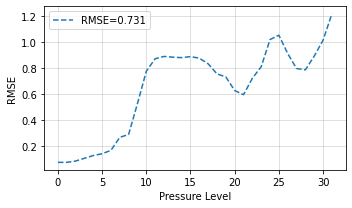

In [9]:
# Instantiate model
model = AggregateRidgeRegression(alpha=0.2)

# Fit individuals covariates against column aggregate targets
model.fit(individuals_covariates, target_covariates)

# Evaluate RMSE
with torch.no_grad():
    pred = model(individuals_covariates.reshape(-1, 5))
plot_rmse_profile(pred, groundtruth_covariates)

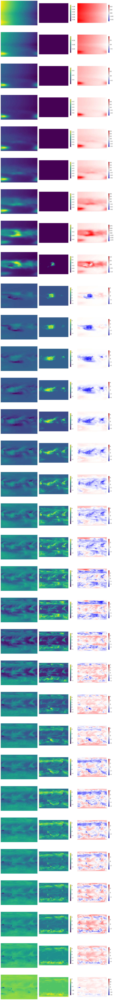

In [12]:
plot_pred_by_layer(pred, groundtruth_grid)

### Aggregate Kernel Ridge Regression

This is the Kernel counterpart of the above Ridge Regression model. In rough terms, we replace any inner product in the above by a kernel $k(x, x')$ such that instead of regressing average features $\frac{1}{n}\sum_{i=1}^n x_i$ against aggregate column targets, we rather regress average kernel features $\frac{1}{n}\sum_{i=1}^n k(x_i, \cdot)$.


This grants greater expressivity to the regression as it allows to look for the regressor in a non-linear functional space spanned by the kernel functions $k(x_i, \cdot)$.


Furthermore, average kernel features $\frac{1}{n}\sum_{i=1}^n k(x_i, \cdot)$ corresponds to the empirical estimate of a quantity known as Kernel Mean Embedding, defined as $\mu_X = \mathbb{E}[k(X, \cdot)]$. The Kernel Mean Embedding is a unique embedding of the probability distribution followed by $X$. Regressing $\mu_X$ can hence be read as regressing the column value distribution against some column aggregate target, hence taking into account the contribution of each individual cell.


This model admits several hyperparameters:
- `alpha -` $L^2$ regularization weight
- `individuals_kernel` hyperparameters, i.e. parameters of the chosen kernel


This method suffers from poor scalability due to kernel matrix inversion cost in $\mathcal{O}($number of bag$\,\!^3)$.

In [32]:
# Instantiate model
model = AggregateKRR(individuals_kernel=kernels.LinearKernel(),
                     alpha=1e-2)

# Choose some random columns to train on for scalability
n_samples = 50
torch.random.manual_seed(5)
rdm_idx = torch.randperm(individuals_covariates.size(0))[:n_samples]
rdm_individuals = individuals_covariates[rdm_idx]
rdm_targets = target_covariates[rdm_idx]

# Fit individuals covariates against column aggregate targets - takes some time
model.fit(rdm_individuals, rdm_targets)

# Evaluate RMSE
with torch.no_grad():
    pred = model(individuals_covariates.reshape(-1, 5))
rmse = eval_rmse(pred, groundtruth_covariates)
print(rmse)

1.082217812538147


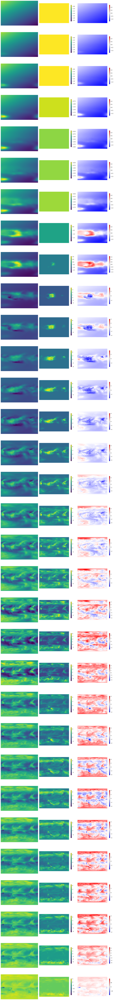

In [30]:
plot_pred_by_layer(pred, groundtruth_grid)

### Conditional Aggregate Kernel Ridge Regression

This is a variante of this above where instead of consider Kernel Mean Embeddings of marginal distributions, we consider embeddings of conditional distributions, called Conditional Mean Embeddings $\mu_{X|Y} = \mathbb{E}[k(X, \cdot)|Y]$ where $Y$ is the column random variable.

It allows to embbed global information about columns relative distance in terms of $Y$ (e.g. latitude, longitude and any other column feature) within each column distribution embedding $\mu_{X|Y=y}$.

In practice, this happens by introducing a second kernel for bag variables $\ell(y, y')$.


This model admits several hyperparameters:
- `alpha -` $L^2$ regularization weight
- `individuals_kernel` hyperparameters, i.e. parameters of the chosen kernel $k$
- `bags_kernel` hyperparameters, i.e. parameters of the chosen kernel $\ell$
- `lbda -` regularization weight for conditional mean embedding estimate


This method suffers from poor scalability due to kernel matrix inversion cost in $\mathcal{O}($number of bag$\,\!^3)$

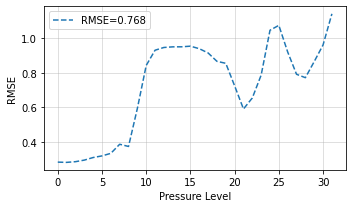

In [33]:
# Instantiate model
model = ConditionalAggregateKRR(individuals_kernel=kernels.LinearKernel(),
                                bags_kernel=kernels.RFFKernel(num_samples=500),
                                lbda=0.001,
                                alpha=0.2)

# Choose some random columns to train on for scalability
n_samples = 500
torch.random.manual_seed(5)
rdm_idx = torch.randperm(individuals_covariates.size(0))[:n_samples]
rdm_individuals = individuals_covariates[rdm_idx]
rdm_bags = bags_covariates[rdm_idx]
rdm_targets = target_covariates[rdm_idx]

# Fit individuals covariates against column aggregate targets - takes some time
model.fit(rdm_individuals, rdm_bags, rdm_targets)

# Evaluate RMSE
with torch.no_grad():
    pred = model(individuals_covariates.reshape(-1, 5))
plot_rmse_profile(pred, groundtruth_covariates)

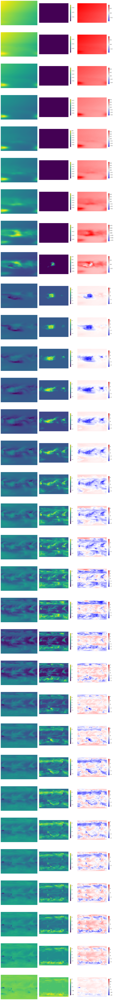

In [34]:
plot_pred_by_layer(pred, groundtruth_grid)